# PLC Buildings' Data Analysis
## Summary
This notebook shows our analysis of the time series data gathered from the PCL buildings. The buildings contains various types of rooms, each equiped with number of sensors and actuators. Throughout this study, we leverage the data from the sensors and actuators as well as weather forecasts in order to infer occupancies of the building zones. This experiments focus on designing Grey-box and Black-box modeling of each zone. In addition, we employ the available sources of data, hence, our modeling is indeed data-driven. 

Our methods are based on linear regression/unsupervised/supervised methods. on each method we make assumptions that might be considered as the limitations of the method. However, our results indicates that the methods are promising and can used to extract occupancy traces for each room.

In [1]:
# boilerplate imports
import time
import datetime
import math
import json
import pvlib

import pandas as pd
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
from itertools import cycle

%matplotlib inline

## Global Constants
In this section, we define the following constants:
- room list: the list of different zones, i.e. offices, corridors, washrooms etc.
- sensor list: the list of sensors and actuators to be monitored
- start and end dates: indicate the days to be monitored
- Other variables for plotting purposes

In [2]:
########################
### GLOBAL CONSTANTS ###
########################

'''
The list of rooms, and the list of sense and control points 
should be read from a metadata store but for now they are hardcoded
'''


########## Building 1 Rooms ##########
# Interior Offices:
# interior_offices_private = [11185, 11166, 11164, 12172]
# interior_offices_shared  = [11144, 11188]

# Exterior Offices:
# exterior_offices_private = [11120, 11121, 11122, 11123, 11124, 11125, 11130, 11131, 11141, 11143, \
#                             11154, 11155, 12103, 12102, 12122, 12124, 12125, 12126, 12128, 12134, \
#                             12136, 12138, 12140, 12144, 12146, 12156, 12157, 13106, 13108, 13110, \
#                             13116, 13118, 13122, 13124, 11118, 11126, 11156, 12150, 12152, 12154, \
#                             13130, 13132, 13140, 13142, 13144, 13146, 13148]
# exterior_offices_shared  = [11156, 11118]

# Corridors: 
# corridors = [11112, 11114, 11174, 11152, 11158, 12175, 13114, 13104, 10112, 10111, 10110, 10104, \
#              10103, 12108, 12175]

# Facility Rooms:
# facility = [11136, 11163, 12180, 12117]

# Elevators:
# elevators = [12118]

# Washtooms:
# washrooms = [11169, 11167, 12169, 12171]

# SharedPlaces (Lobby, Meeting Rooms):
# open_area = [11103, 11101, 11150, 12104, 12158, 12148, 12190, 12184, 12130]
# meeting = [11108, 11106, 11104, 11162, 11165, 11142, 11128, 12016, 12170, 12142]
# conference = [12110]

########## Building 2 Rooms ##########
# Interior Offices:
# interior_offices_private = [306, 304, 302]
# Exterior Offices:
# exterior_offices_private = [231, 229, 227, 223, 219, 217, 213, 211, 202, 203, 201, 443, 431, 429, 427, \
#                             428, 424, 421, 419, 417, 413, 411, 409, 407, 403, 341, 412, 408, 406, 404, \
#                             402, 333, 329, 327, 323, 321, 319, 339, 322, 318, 316, 314, 308, 337, 433, \
#                             317, 313, 311, 309, 307, 303]
# Corridors:
# corridors = [216, 208, 105, 226, 209, 212, \
#              101, 103, 418, 312]
# Facility Rooms:
# facility_rooms = [206, 301]
# Elevators:
# elevators = []
# Washtooms:
# washrooms = []
# SharedPlaces (Lobby, Meeting Rooms):
# shared_places = [204, 401, 205, 207]

# room_list = shared_places + washrooms + elevators + facility_rooms + corridors + exterior_offices_private + interior_offices_private

room_list = [100, 200, 201, 202, 203, 300, 551, 552, 700]

# room_list = facility_rooms
# room_list = [106, 112, 210, 230, 312, 327, 328, 329, 303]
# room_list = [118, 303, 105, 121, 104, 106, 208]

# sensor_list = ['TL1', 'TL2', 'TL3', 'TL4', 'TL5', 'TL6', 'TL8', 'TL13']
# sensor_list = ['TL1', 'TL3', 'TL5', 'TL6', 'TL8']

sensor_list = ['TL1', 'TL3', 'TL5', 'TL8', 'TL6']

# sensor_list = ['TL1']
# sensor_list = ['TL1', 'TL13', 'TL2', 'TL3', 'TL4', 'TL5', 'TL6', 'TL8', 'TL91', 'TL92']

start_time = '2017-01-23 00:00:00'
end_time = '2017-03-06 00:00:00'

# start_time = '2017-04-10 00:00:00'
# end_time = '2017-05-01 00:00:00'

# Specify the first day

firstday = 0 # 0 -> Monday
days_number = 42


daylbl = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# daylbl = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday', \
#          'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday', \
#          'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday', \
#          'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday', \
#          'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

day_labels = daylbl[firstday:] + daylbl[:firstday]
maxnumreadings = 0

## Reading Data
This section reads sensor data for every room in 'room_list'. It is important to note that not all sensors are available in each zone. The section contains the following parts:

- Function 'getAndFormatData': Gets the data for a uuid and returns a windowed resampled pandas series
- Function 'addToData': Formats the pandas objects into a data array
- Function 'getSortedNamedStream': Gets sensor data for a specific zone
- Two scripts for pulling in data and removing data of sensors that have less readings of a defined threshold

In [3]:
####################
### Reading Data ###
####################

def getAndFormatData(zone, stream_name, prefix):
    '''
    Gets the data for a uuid and returns a windowed resampled pandas series
    '''
    
    global maxnumreadings
    
    try:
        json_data = json.load(open('../PCL/Bldg5/' + prefix + '{}.{}.json'.format(zone, stream_name)))
        
        samples = json_data["samples"]
        # point_count = json_data["count"]
        
    except (FileNotFoundError, KeyError) as er:
        print("Error: No samples found for stream_name : %s in zone : %s" % (stream_name, zone))
        
        raise er
        # return {}
    
    else:
        values = [dp["v"] for dp in samples]
        timestamps = [dp["ts"] for dp in samples]
        ts_dt = list(map(lambda x: datetime.datetime.strptime(x, "%Y-%m-%d %H:%M:%S.%f"), timestamps))
        
        #print(ts_dt)
        
        sensor_dict = {}

        for i in range(len(ts_dt)):
            sensor_dict[ts_dt[i]] = values[i]

#         pd_sensor = pd.Series(sensor_dict).loc['2016-12-18 00:00:00':'2017-12-18 00:00:00']
        pd_sensor = pd.Series(sensor_dict).loc[start_time:end_time]
        
        if maxnumreadings < len(pd_sensor):
            maxnumreadings = len(pd_sensor)
        
        # resampled = pd_sensor.resample('10T').mean().ffill()
        resampled = pd_sensor.resample('10T').mean().ffill().bfill()
        # print(resampled)
        
    return resampled



def addToData(name, pandas_series, data, first=False):
    '''
    Formats the pandas objects into a data array
    '''
    
    indices = pandas_series.index
    for i in range(len(pandas_series)):
        if first==True:
            data[time.mktime(indices[i].to_pydatetime().timetuple())] = {}
        
        data[time.mktime(indices[i].to_pydatetime().timetuple())][name] = pandas_series[i]

    return data


def getSortedNamedStream(zone, stream_name, prefix): 
    '''
    Gets sensor data for a specific zone
    '''
    
    print("Getting data for zone : %s , stream_name : %s" % (zone, stream_name))
    
    try:
        pd_stream = getAndFormatData(zone, stream_name, prefix)
    except (FileNotFoundError, KeyError) as er:
        return ([], [])
    else:
        data = {}
        addToData(stream_name, pd_stream, data, True)
        retV = []

        for t in sorted(data):
            retV.append((t, data[t][stream_name]))

        retT = range(len(retV))
        print("Length of series %s:%s is %d " % (zone, stream_name, len(retT) ))
        retV = sorted(retV, key=lambda k:k[0])
        times = [ int(t) for t in range(len(retV))]
        values = [ v for (t,v) in retV ]
        
        return (times, values)

In [4]:
# pulling in data

tsdata = {}

for room in room_list:
    tsdata[room] = {}
    #print(room)
    for sensor in sensor_list:
        # prefix_list = ['101', '102', '103', '105', '107', '110', '120', '130', '140']
        #print(sensor)
        prefix_list = ['10']
        # print(sensor)
        for prefix in prefix_list:
            temp = []
            temp.append(getSortedNamedStream(room, sensor, prefix))
            tsdata[room][sensor] = temp

Getting data for zone : 100 , stream_name : TL1
Error: No samples found for stream_name : TL1 in zone : 100
Getting data for zone : 100 , stream_name : TL3
Length of series 100:TL3 is 6048 
Getting data for zone : 100 , stream_name : TL5
Length of series 100:TL5 is 6048 
Getting data for zone : 100 , stream_name : TL8
Error: No samples found for stream_name : TL8 in zone : 100
Getting data for zone : 100 , stream_name : TL6
Length of series 100:TL6 is 6048 
Getting data for zone : 200 , stream_name : TL1
Length of series 200:TL1 is 6048 
Getting data for zone : 200 , stream_name : TL3
Length of series 200:TL3 is 6047 
Getting data for zone : 200 , stream_name : TL5
Length of series 200:TL5 is 6048 
Getting data for zone : 200 , stream_name : TL8
Length of series 200:TL8 is 6048 
Getting data for zone : 200 , stream_name : TL6
Length of series 200:TL6 is 6047 
Getting data for zone : 201 , stream_name : TL1
Length of series 201:TL1 is 6047 
Getting data for zone : 201 , stream_name : TL

In [5]:
#Deleting sensors that have missing data
for room in room_list:
    for sensor in sensor_list:
        try:
            if len(tsdata[room][sensor][0][1]) <= 0.5 * maxnumreadings:
                print("Deleting sensor %s in room : %s due to missing data. Number of datapoints : %s" % (sensor, room, len(tsdata[room][sensor][0])))
                del tsdata[room][sensor]
        except:
            pass
        
black_list = []
for room in room_list:
    try:
        if (len(tsdata[room]['TL1'][0][1]) == 0):
            del tsdata[room]
            black_list.append(room)
    except:
        black_list.append(room)
        
# temporary fix of the huge number problem:
import numpy as np

for room in room_list:
    for sensor in sensor_list:
        if (not(room in black_list)):
            try:
                if len(tsdata[room][sensor][0][1]) > 1:
                    max_inx = np.argmax(tsdata[room][sensor][0][1])
                    min_inx = np.argmin(tsdata[room][sensor][0][1])
                    tsdata[room][sensor][0][1][max_inx] = tsdata[room][sensor][0][1][min_inx]
                else:
                    max_inx = argmax(tsdata[room][sensor][0][1])
                    tsdata[room][sensor][0][max_inx] = 0
            except:
                pass

Deleting sensor TL1 in room : 100 due to missing data. Number of datapoints : 2
Deleting sensor TL8 in room : 100 due to missing data. Number of datapoints : 2
Deleting sensor TL3 in room : 200 due to missing data. Number of datapoints : 2
Deleting sensor TL6 in room : 200 due to missing data. Number of datapoints : 2
Deleting sensor TL1 in room : 201 due to missing data. Number of datapoints : 2
Deleting sensor TL3 in room : 201 due to missing data. Number of datapoints : 2
Deleting sensor TL5 in room : 201 due to missing data. Number of datapoints : 2
Deleting sensor TL8 in room : 201 due to missing data. Number of datapoints : 2
Deleting sensor TL6 in room : 201 due to missing data. Number of datapoints : 2
Deleting sensor TL3 in room : 202 due to missing data. Number of datapoints : 2
Deleting sensor TL5 in room : 202 due to missing data. Number of datapoints : 2
Deleting sensor TL8 in room : 202 due to missing data. Number of datapoints : 2
Deleting sensor TL6 in room : 202 due to

## Plotting Method
the function 'plotAllSensorData' plots all the available sensors' value in a given zone if isSensorValue = 1. Otherwise, it plots an arbitrary series of data, such as temperature, in a given zone. This section follows a script that calls the function for each zone to plot their available sensors' data.

In [6]:
# plotting

matplotlib.rcParams['figure.figsize'] = (30.0, 10.0)
colors = {'TL1':'r', 'TL3':'--m', 'TL5':'b', 'TL8':'--g', 'TL6':':c'}

def plotAllSensorData(zone, data, isSensorValue):
    fig, ax = plt.subplots()
    ax2 = ax.twinx()
    ax3 = ax.twinx()
    
    # Move the last y-axis spine over to the right by x% of the width of the axes
    ax3.spines['right'].set_position(('axes', 1.05))
    ax3.set_frame_on(True)
    ax3.patch.set_visible(False)
    ax3.yaxis.set_major_formatter(matplotlib.ticker.OldScalarFormatter())
    
    lines = []
    line_styles = cycle(['-', '--', '-', '--', ':', '-.'])
    colors = cycle(['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9'])
    #cols = cycle(['room temperature', 'room temperature setpoint', 'flow', 'flow setpoint', 'damper position'])
    cols = cycle(['Room Temperature', 'Flow', 'Differential Pressure', 'Radiator Valve', 'Damper Position'])
    
    if (isSensorValue):
        for sensor in sensor_list:
            try:
                t, x = data[zone][sensor][0]
                x = x[:5040]
                t = t[:5040]
                ls= next(line_styles)
                color = next(colors)
                col = next(cols)
                
                ax.plot(t, x, linestyle = ls, label = col, color = color)

                numdays = math.floor(len(x)/(6*24))
                xticklabels = day_labels*int(numdays/7)+day_labels[0:(numdays%7)]

                plt.xticks(np.arange(0, len(x), 6*24), xticklabels, rotation=90)
                plt.xlim(-0.000001, len(x))
                ax.set_xlabel('Time', size = 'x-large')


                if(col == 'Temperature'):
                    ax.set_ylabel('Temperature (C)', size = 'x-large')
                elif(col == 'Flow'):
                    ax.set_ylabel('Flow (L/s)', size = 'x-large')
                elif(col == 'Differential Pressure'):
                    ax.set_ylabel('Differential Pressure (Pa)', size = 'x-large')
                elif(col == 'Radiator Valve'):
                    ax.set_ylabel('Radiator Valve', size = 'x-large')
                elif(col == 'Damper Position'):
                    ax.set_ylabel('Damper Position (%)', size = 'x-large')

            except:
                ls= next(line_styles)
                color = next(colors)
                col = next(cols)
                print('No data for' + sensor)
                
    else:
        try:
            x = data[int(zone)][0]
            t = tsdata[int(zone)]['TL1'][0]
            x = x[:1007]
            
            t = np.array(transpose(t))
            t = t[:1008]
            w1 = []
            for i in range(0, len(t)):
                w1.append(t[i])
            #print(t)
            w1 = w1[1:]
            ls= next(line_styles)
            color = next(colors)
            col = next(cols)

            ax.plot(w1, x, linestyle = ls, label = col, color = color)
            numdays = math.floor(len(x)/(6*24))
            xticklabels = day_labels*int(numdays/7)+day_labels[0:(numdays%7)]

            plt.xticks(np.arange(0, len(x), 6*24), xticklabels, rotation=90)
            plt.xlim(-0.000001, len(x))
            ax.set_xlabel('Time', size = 'x-large')
            ax.set_ylabel('Q', size = 'x-large')
        except:
            print('No data for room ' + zone)
            
    fig.tight_layout()
    fig.legend(bbox_to_anchor=(.92, .95), loc=1, borderaxespad=0.)
    plt.show()

In [7]:
# for room in room_list:
    # if (not(room in black_list)):
        # print("Room No. is: " + str(room))
        # print(tsdata[room])
        # plotAllSensorData(room, tsdata, 1)

## Aswani's Method for Obtaining Occupants' Trace on Temperature
https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=5985456

We borrow the Discrete Time Model from the mentioned study, in order to model the temperature change for each zone. The model can be considered as semiparametric regression of partially linear models, as shown in the following equation:

\begin{align}
T[n+1] & =  \theta_1 T[n] + \theta_2 u[n] + \theta_3 w_1[n] + ... +\theta_n w_m[n] + q[n],
\end{align}

Where $T[n], u[n]$ are temperature and control input in time $n$; $w_i, i=1...m$ are any factors that can affect temperature assuming to have linear relation with it. Finally, $q[n]$ is changes of temperature due to several nonlinear behavior reasons like occupancy of people, equipment, external weather conditions. Based on a method given in  (https://www.jstor.org/stable/1912705?seq=1#page_scan_tab_contents), we are able to calculate the coefficients $\theta_i, i=1...n$. By plugging in the coefficients, and sensor readings representing $T[n], u[n], w_i, i=1...m$, we are able to calculate $q[n]$. 

The following is the assumption of this model:

- The relation between temperature change and some other factors is linear, and
- The temperature change in $q[n]$ is mainly due to the occupancy of humans.

In [8]:
#####################################################################
### Aswani's Method for Obtaining Occupants' Trace on Temperature ###
#####################################################################

X = {}
X_original = {}
for room in room_list:
    if (not(room in black_list)):
        X[room] = {}
        X_original[room]= {}
        for sensor in sensor_list:
            try:
                X[room][sensor] = []
                X_original[room][sensor] = []
                for data in range (0, len(tsdata[room][sensor][0][1])):
                    try:
                        X_original[room][sensor].append(tsdata[room][sensor][0][1][data])
                        if (data == 0):
                            X[room][sensor].append(tsdata[room][sensor][0][1][data] - np.mean(tsdata[room][sensor][0][1][data]))
                        else:
                            X[room][sensor].append(tsdata[room][sensor][0][1][data] - np.mean(tsdata[room][sensor][0][1][:data]))
                    except:
                        print('error is here')
            except:
                print('No data for ' + str(sensor) + ' in room ' + str(room))

No data for TL3 in room 200
No data for TL6 in room 200
No data for TL3 in room 202
No data for TL5 in room 202
No data for TL8 in room 202
No data for TL6 in room 202
No data for TL3 in room 300
No data for TL5 in room 300
No data for TL6 in room 300


In [9]:
from numpy import *
from scipy.interpolate import *
from sklearn.linear_model import LinearRegression

coefs = {}
T_original = {}
V_original = {}
for room in room_list:
    if (not(room in black_list)):
        T = []
        V = []
        T_original[room] = []
        V_original[room] = []
        
        coefs[room] = []
        for sensor in sensor_list:
            if (sensor == 'TL1'):
                    T = X[room][sensor]
                    T_original[room] = X_original[room][sensor]
            else:
                if (len(X[room][sensor]) > 0):
                    if (len(V) > 0):
                        V = concatenate((V, [X[room][sensor][:-1]]))
                        V_original[room] = concatenate((V_original[room], [X_original[room][sensor][:-1]]))
                    else:
                        V = [X[room][sensor][:-1]]
                        V_original[room] = [X_original[room][sensor][:-1]]
        if (len(V) != 0):
            V = concatenate((V, [T[1:]]))
            V_original[room] = concatenate((V_original[room], [T_original[room][1:]]))
        else:
            V = [T[1:]]
            V_original[room] = [T_original[room][1:]]
      
        regressor = LinearRegression()
        Coffs = regressor.fit(transpose(V), T[:-1])
        coefs[room] = regressor.coef_

In [10]:
q = {}
for room in room_list:
    if (not(room in black_list)):
        if (not(room in black_list)):
            #print(coefs[room])
            q[room] = []
            q[room].append(T_original[room][1:] - (transpose(coefs[room] * transpose(V_original[room])).sum(axis=0)))
        

Naive Q Plotting
Room No is: 200


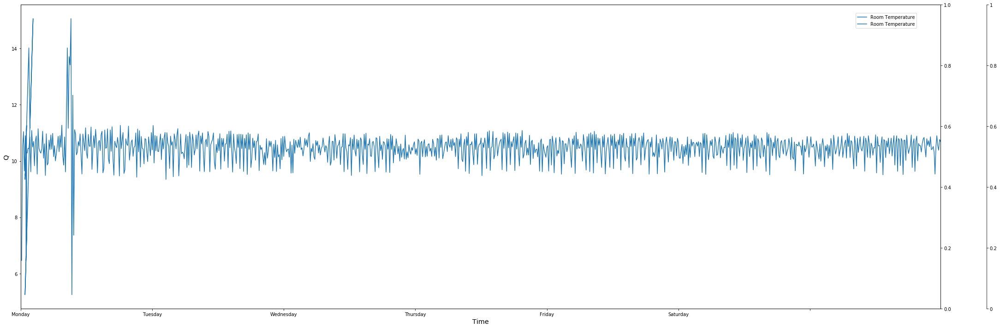

Room No is: 202


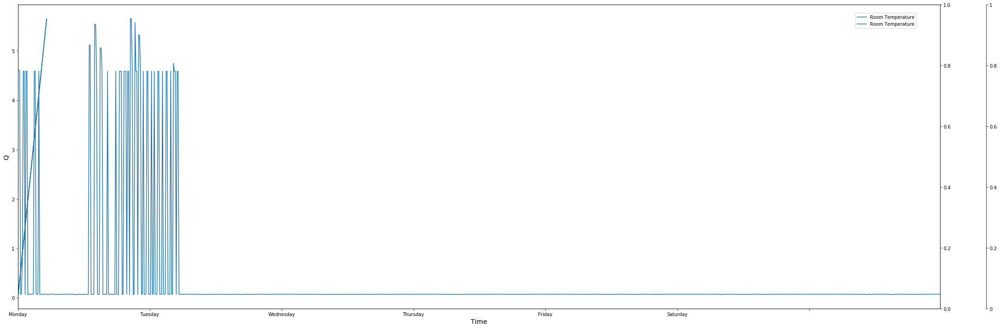

Room No is: 300


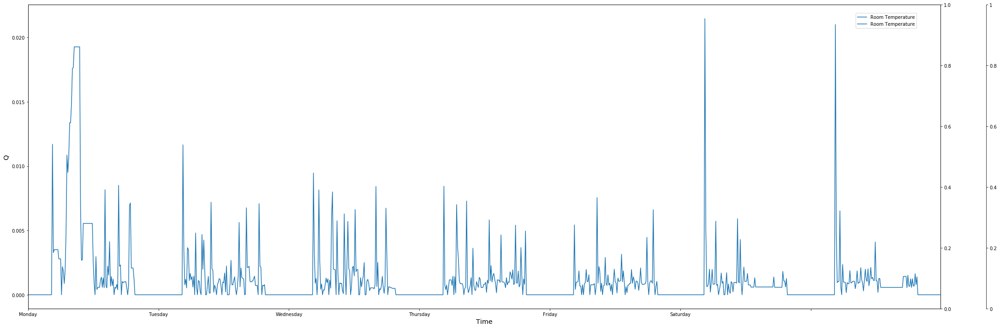

Room No is: 551


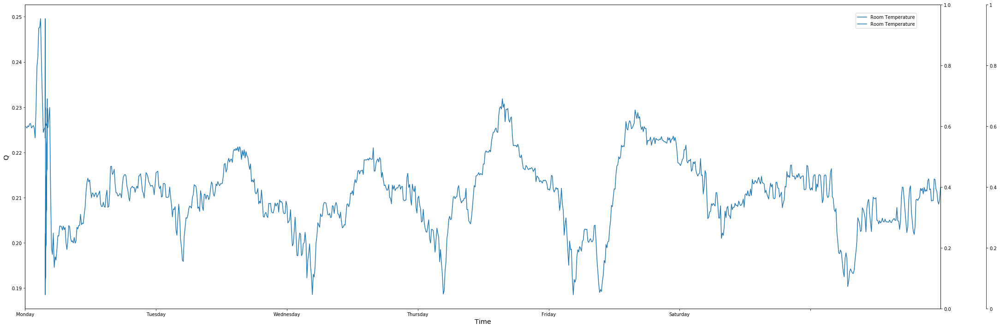

Room No is: 552


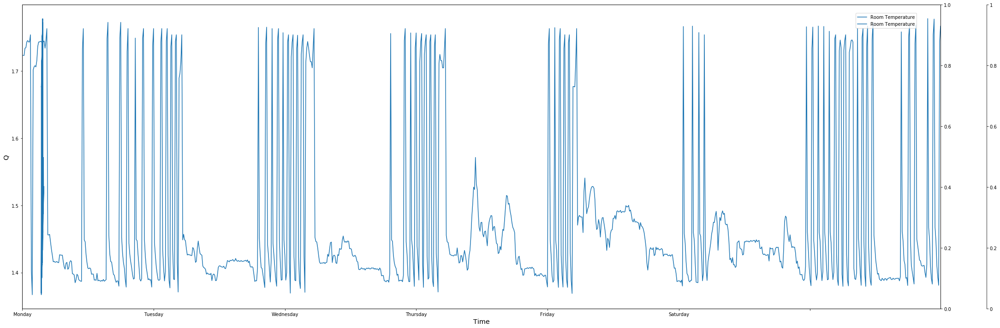

Room No is: 700


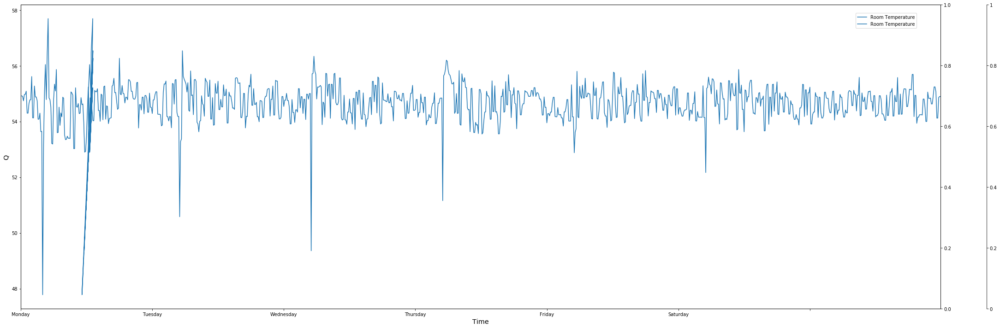

In [11]:
print("Naive Q Plotting")
for room in room_list:
    if (not(room in black_list)):
        print('Room No is: ' + str(room))
        #print(q[106][0])
        plotAllSensorData(str(room), q, 0)

## Excluding Outside Weather Data From $q[n]$
As mentioned before, the obtained $q[n]$ is the temprature change due to several environmental factors, such as occupancy of people, equipment, external weather conditions. In this section we remove the external weather conditions from zones that have windows/doors to outside environment. To do so, we obtain weather data for the days included in our study. Specifically, temperature, windSpeed, sunrise and sunset times are extracted. By assuming that these factors have linear relation on the temperature change, then we can insert them as $w_1, w_2, w_3, w_4$ in the Aswani's Discrete Time Model.

The following is the assumption of this model:

- The relation between temperature change and some other factors is linear,
- The relation between temperature change and external weather conditions is linear

In [12]:
######################################
### EXCLUDING OUTSIDE WEATHER DATA ###
######################################
import requests

def GetWeatherData(day):
    url = "https://api.darksky.net/forecast/044b659c34748a0f15c31e5c2bc1cb9c/53.5444,-113.4909," + day + "?exclude=flags"
    response = requests.get(url)
    data = response.json()
    return data

In [13]:
days = ['1485154800', '1485241200', '1485327600', '1485414000', '1485500400', '1485586800', '1485673200', \
        '1485759600', '1485846000', '1485932400', '1486018800', '1486105200', '1486191600', '1486278000', \
        '1486364400', '1486450800', '1486537200', '1486623600', '1486710000', '1486796400', '1486882800', \
        '1486969200', '1487055600', '1487142000', '1487228400', '1487314800', '1487401200', '1487487600', \
        '1487574000', '1487660400', '1487746800', '1487833200', '1487919600', '1488006000', '1488092400', \
        '1488178800', '1488265200', '1488351600', '1488438000', '1488524400', '1488610800', '1488697200']
#days = ['1485586800', '1485673200', '1485846000', '1485932400', '1486018800']

weather_data = []
for i in range(len(days)):
    weather_data.append(GetWeatherData(days[i]))

In [14]:
tuned_data = []
for day in range(len(days)):
    for hour in range(0, 24):
        temp = weather_data[day]['hourly']['data'][hour]['temperature']
        wind = weather_data[day]['hourly']['data'][hour]['windSpeed']
        sunr = weather_data[day]['daily']['data'][0]['sunriseTime']
        suns = weather_data[day]['daily']['data'][0]['sunsetTime']
        
        try:
            cloud = weather_data[day]['hourly']['data'][hour]['cloudCover']
            try:
                for index in range(len(tuned_data)):
                    if(tuned_data[index][2] == -1):
                        tuned_data[index][2] = cloud;
            except:
                print('warning')
        except:
            cloud = -1
        
        for j in range(0, 6):
            tuned_data.append([temp, wind, cloud, sunr, suns])
            
import numpy as np
tuned_data = np.asarray(tuned_data)

In [15]:
latitude = 53.5444
longitude = -113.4909

start_time = '2017-01-23 00:00:00'
end_time = '2017-03-06 00:00:00'

stime = start_time.split(' ')[0]
etime = end_time.split(' ')[0]

tus = pvlib.location.Location(latitude, longitude, 'America/Edmonton', 645, 'Edmonton')
times = pd.DatetimeIndex(start = start_time, end = end_time, freq='10min', tz=tus.tz)

ephem_data = tus.get_solarposition(times)
irrad_data = tus.get_clearsky(times)

sun_zen = ephem_data['apparent_zenith']
AM = pvlib.atmosphere.relativeairmass(sun_zen)
dni_et = pvlib.irradiance.extraradiation(times.dayofyear)

models = ['isotropic', 'klucher', 'haydavies', 'reindl', 'king', 'perez']
totals = {}

#for model in models:
model = 'isotropic'

total = pvlib.irradiance.total_irrad(60, 180, ephem_data['apparent_zenith'], ephem_data['azimuth'],
                                              dni=irrad_data['dni'], ghi=irrad_data['ghi'], dhi=irrad_data['dhi'],
                                              dni_extra=dni_et, airmass=AM,
                                              model=model,
                                              surface_type='urban')
solar_data = []
for i in range(len(total)):
     solar_data.append([total.iloc[i][0], total.iloc[i][1], 
                        total.iloc[i][2], total.iloc[i][3], 
                        total.iloc[i][4]])

solar_data = transpose(np.asarray(solar_data))    

In [16]:
from numpy import *
from scipy.interpolate import *
from sklearn.linear_model import LinearRegression

coefs_p = {}
T_original_p = {}
V_original_p = {}
for room in room_list:
    if (not(room in black_list)):
        T_p = []
        V_p = []
        T_original_p[room] = []
        V_original_p[room] = []
        
        coefs_p[room] = []
        for sensor in sensor_list:
            if (sensor == 'TL1'):
                    T_p = X[room][sensor]
                    T_original_p[room] = X_original[room][sensor]
            else:
                if (len(X[room][sensor]) > 0):
                    if (len(V_p) > 0):
                        V_p = concatenate((V_p, [X[room][sensor][:-1]]))
                        V_original_p[room] = concatenate((V_original_p[room], [X_original[room][sensor][:-1]]))
                    else:
                        V_p = [X[room][sensor][:-1]]
                        V_original_p[room] = [X_original[room][sensor][:-1]]

        if (len(V_p) != 0):
            V_p = concatenate((V_p, [T_p[1:]]))
        else:
            V_p = [T_p[1:]]
            
        if (len(V_original_p[room]) != 0):
            V_original_p[room] = concatenate((V_original_p[room], [T_original_p[room][1:]]))
        else:
            V_original_p[room] = [T_original_p[room][1:]]

        V_p = vstack((V_p, tuned_data[:-1,0]))
        V_p = vstack((V_p, tuned_data[:-1,1]))
        V_p = vstack((V_p, tuned_data[:-1,2]))
           
        V_p = vstack((V_p, solar_data[0][:-2]))
        V_p = vstack((V_p, solar_data[1][:-2]))
        V_p = vstack((V_p, solar_data[2][:-2]))
        V_p = vstack((V_p, solar_data[3][:-2]))
        V_p = vstack((V_p, solar_data[4][:-2]))
        
        V_original_p[room] = vstack((V_original_p[room], tuned_data[:-1,0]))
        V_original_p[room] = vstack((V_original_p[room], tuned_data[:-1,1]))
        V_original_p[room] = vstack((V_original_p[room], tuned_data[:-1,2]))
        
        V_original_p[room] = vstack((V_original_p[room], solar_data[0][:-2]))
        V_original_p[room] = vstack((V_original_p[room], solar_data[1][:-2]))
        V_original_p[room] = vstack((V_original_p[room], solar_data[2][:-2]))
        V_original_p[room] = vstack((V_original_p[room], solar_data[3][:-2]))
        V_original_p[room] = vstack((V_original_p[room], solar_data[4][:-2]))
        
        regressor = LinearRegression()
        Coffs = regressor.fit(transpose(V_p), T_p[:-1])
        coefs_p[room] = regressor.coef_

In [17]:
q_p = {}
for room in room_list:
    if (not(room in black_list)):
        # if (not(room in interior_offices_private or room in corridors)):
        # if (not(room in interior_offices_private)):
        if(True):
            q_p[room] = []
            q_p[room].append(T_original_p[room][1:] - (transpose(coefs_p[room] * transpose(V_original_p[room])).sum(axis=0)))
        else:
            q_p[room] = []
            q_p[room].append(q[room][0])

Ploting Q, excluding weather effects
200


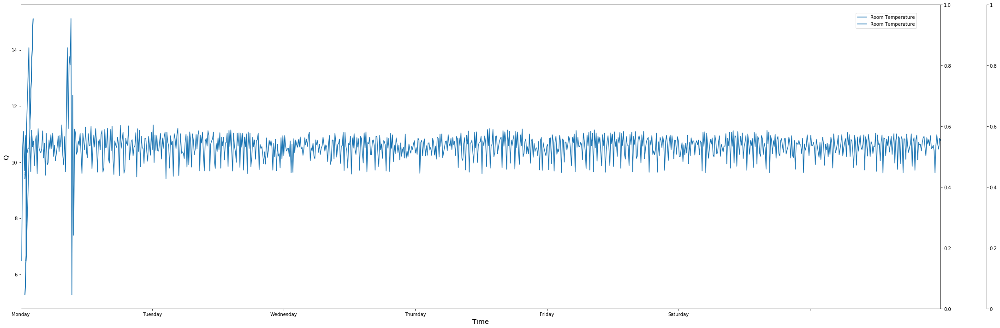

202


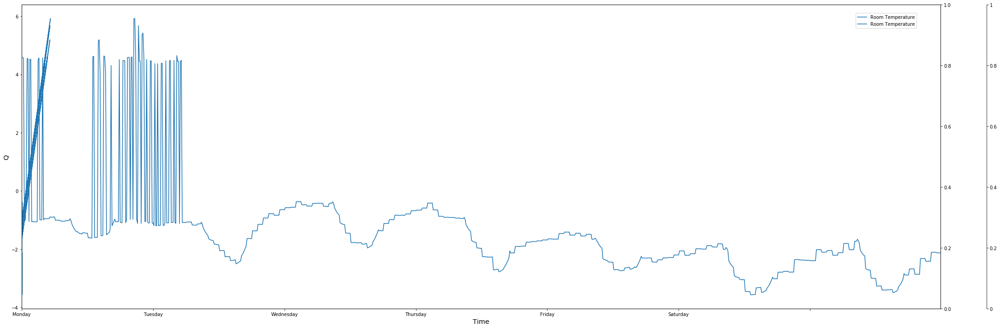

300


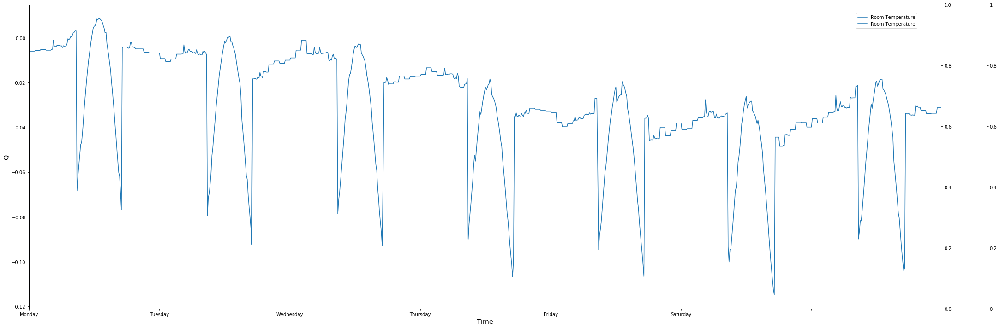

551


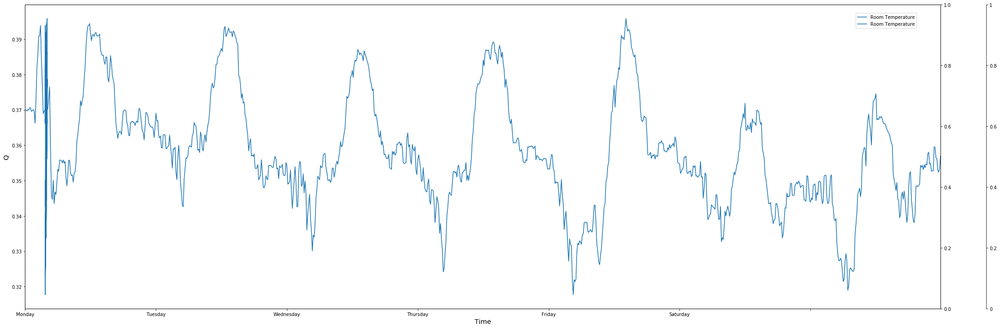

552


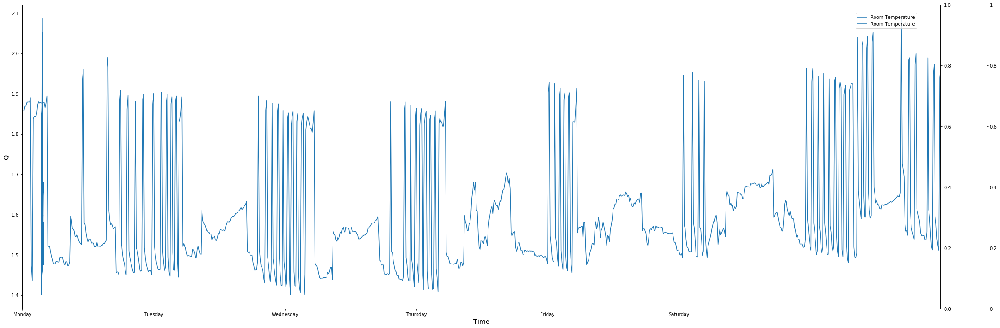

700


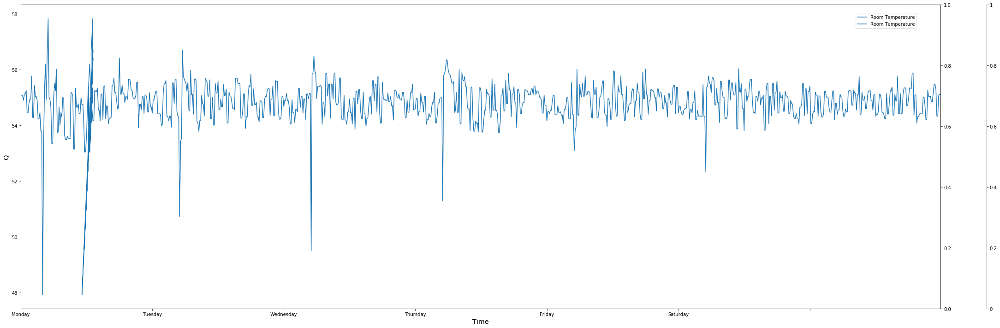

In [18]:
print("Ploting Q, excluding weather effects")
for room in room_list:
    if (not(room in black_list)):
        print(room)
        # print('room no. is: ' + str(room) + ' Interior zone? ' + str((room in interior_offices_private or room in corridors)))
        plotAllSensorData(str(room), q_p, 0)

## Clustering and Fuzzy-Clustering Methods to Infer Occupancy Trace
By observing the data streams for each room, it should be possible to determine if there is any occupants in the room or not. Therefore, we apply K-Means Clustering method for each room. We assumed that 2 clusters exist, i.e. no occupants exist, occupants exist.

Moreover, we applied K-Means Fuzzy Clustering method to the data. This is due to the intuition to include uncertainty in the clustering method. From this point of view, we can observe that how certain is the clustering method about the existence/non-existence of occupants.

The following is the assumption of this model:

- The changes in data stream are significantly due to the occupancy changes

In [19]:
# plotting
import numpy as np

matplotlib.rcParams['figure.figsize'] = (30.0, 10.0)

colors = {'TL1':'r', 'TL3':'--m', 'TL5':'b', 'TL8':'--g', 'TL6':':c'}

def ClusterPlot(zone, data):
    fig, ax = plt.subplots()
    ax2 = ax.twinx()
    ax3 = ax.twinx()
    
    # Move the last y-axis spine over to the right by x% of the width of the axes
    ax3.spines['right'].set_position(('axes', 1.05))
    ax3.set_frame_on(True)
    ax3.patch.set_visible(False)
    ax3.yaxis.set_major_formatter(matplotlib.ticker.OldScalarFormatter())
    
    lines = []

    x = data[zone]
    t = tsdata[zone]['TL1'][0]
    t = t[0][:1008]
    #t = np.array(transpose(t))
    #print(t)
    w1 = []
    for i in range(0, len(t)):
        w1.append(t[i])
    
    #w1 = w1[1:]
    
    w2 = []
    for i in range(0, len(x[0])):
        w2.append(x[0][i])

    w2 = w2[:1008]
    
    ax.plot(w1, w2, linestyle = '-.', label = 'Cluster Label', color = 'C9')

    numdays = math.floor(len(w2)/(6*24))
    xticklabels = day_labels*int(numdays/7)+day_labels[0:(numdays%7)]

    plt.xticks(np.arange(0, len(w2), 6*24), xticklabels, rotation=90)
    plt.xlim(-0.000001, len(w2))
    plt.ylim(min(w2), max(w2))
    ax.set_xlabel('Time', size = 'x-large')
    ax.set_ylabel('Cluster Label', size = 'x-large')

    
    ####################
    fig, ax = plt.subplots()
    ax2 = ax.twinx()
    ax3 = ax.twinx()

    # Move the last y-axis spine over to the right by x% of the width of the axes
    ax3.spines['right'].set_position(('axes', 1.05))
    ax3.set_frame_on(True)
    ax3.patch.set_visible(False)
    ax3.yaxis.set_major_formatter(matplotlib.ticker.OldScalarFormatter())

    lines = []
    line_styles = cycle(['-', '--', '-', '--', ':', '-.'])
    colors = cycle(['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9'])
    #cols = cycle(['room temperature', 'room temperature setpoint', 'flow', 'flow setpoint', 'damper position'])
    cols = cycle(['Room Temperature', 'Flow', 'Differential Pressure', 'Radiator Valve', 'Damper Position'])


    for sensor in sensor_list:
        try:
            t, x = tsdata[zone][sensor][0]
            
            t = t[:1008]
            x = x[:1008]
            
            ls= next(line_styles)
            color = next(colors)
            col = next(cols)

            ax.plot(t, x, linestyle = ls, label = col, color = color)

            numdays = math.floor(len(x)/(6*24))
            xticklabels = day_labels*int(numdays/days_number)+day_labels[0:(numdays%days_number)]

            plt.xticks(np.arange(0, len(x), 6*24), xticklabels, rotation=90)
            plt.xlim(-0.000001, len(x))
            ax.set_xlabel('Time', size = 'x-large')


            if(col == 'Temperature'):
                ax.set_ylabel('Temperature (C)', size = 'x-large')
            elif(col == 'Flow'):
                ax.set_ylabel('Flow (L/s)', size = 'x-large')
            elif(col == 'Differential Pressure'):
                ax.set_ylabel('Differential Pressure (Pa)', size = 'x-large')
            elif(col == 'Radiator Valve'):
                ax.set_ylabel('Radiator Valve', size = 'x-large')
            elif(col == 'Damper Position'):
                ax.set_ylabel('Damper Position (%)', size = 'x-large')

        except:
            ls= next(line_styles)
            color = next(colors)
            col = next(cols)
            print('No data for' + sensor)

    fig.tight_layout()
    fig.legend(bbox_to_anchor=(.92, .95), loc=1, borderaxespad=0.)
    plt.show()

In [20]:
# plotting
import numpy as np

matplotlib.rcParams['figure.figsize'] = (30.0, 10.0)

colors = {'TL1':'r', 'TL2':'--m', 'TL3':'b', 'TL4':'--g', 'TL6':':c'}

def FuzzyClusterPlot(zone):
    
    fig, ax = plt.subplots()
    ax2 = ax.twinx()
    ax3 = ax.twinx()
    
    # Move the last y-axis spine over to the right by x% of the width of the axes
    ax3.spines['right'].set_position(('axes', 1.05))
    ax3.set_frame_on(True)
    ax3.patch.set_visible(False)
    ax3.yaxis.set_major_formatter(matplotlib.ticker.OldScalarFormatter())
    
    lines = []
    line_styles = cycle(['-', '--', '-', '--', ':', '-.'])
    colors = cycle(['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9'])
    cols = cycle(['cluster label', 'room temperature', 'room temperature setpoint', 'flow', 'flow setpoint', 'damper position'])

    x = result[zone]
   # x = np.array(q[zone][0])
    t = tsdata[zone]['TL1'][0]
    #t = np.array(transpose(t[:-1]))
    t = np.array(transpose(t))
    
    x = x[:1008]
    t = t[:1008]
    
    w1 = []
    for i in range(0, len(t)):
        w1.append(t[i])
    
    #w1 = w1[1:]
    
    w2 = []
    for i in range(0, len(x[0])):
        w2.append(x[0][i])
    
    ls= next(line_styles)
    color = next(colors)
    col = next(cols)

    print(col);
    
    ax.plot(w1, w2, linestyle = ls, label = col, color = color)

    numdays = math.floor(len(w2)/(6*24))
    xticklabels = day_labels*int(numdays/7)+day_labels[0:(numdays%7)]

    plt.xticks(np.arange(0, len(w2), 6*24), xticklabels, rotation=90)
    plt.xlim(-0.000001, len(w2))
    plt.ylim(min(w2), max(w2))
    ax.set_xlabel('Time', size = 'x-large')
    ax.set_ylabel('Temperature (C)', size = 'x-large')
    
            
    fig.tight_layout()
    fig.legend(bbox_to_anchor=(.92, .95), loc=1, borderaxespad=0.)
    plt.show()

no data for sensor TL3 in room no. 200
no data for sensor TL6 in room no. 200
no data for sensor TL3 in room no. 202
no data for sensor TL5 in room no. 202
no data for sensor TL8 in room no. 202
no data for sensor TL6 in room no. 202
no data for sensor TL3 in room no. 300
no data for sensor TL5 in room no. 300
no data for sensor TL6 in room no. 300
No data forTL3
No data forTL6


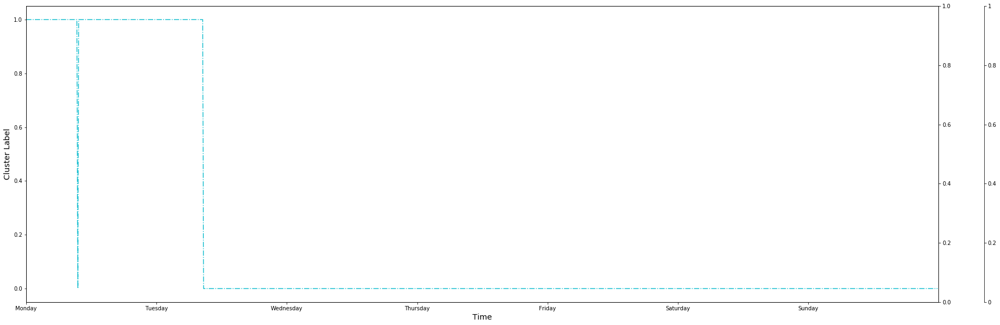

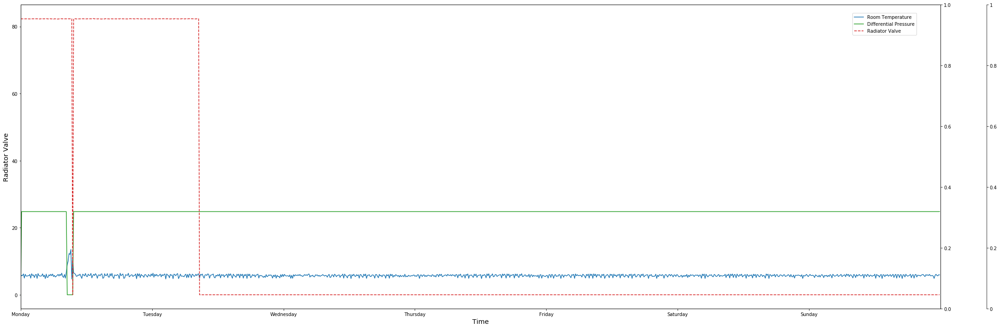

No data forTL3
No data forTL5
No data forTL8
No data forTL6


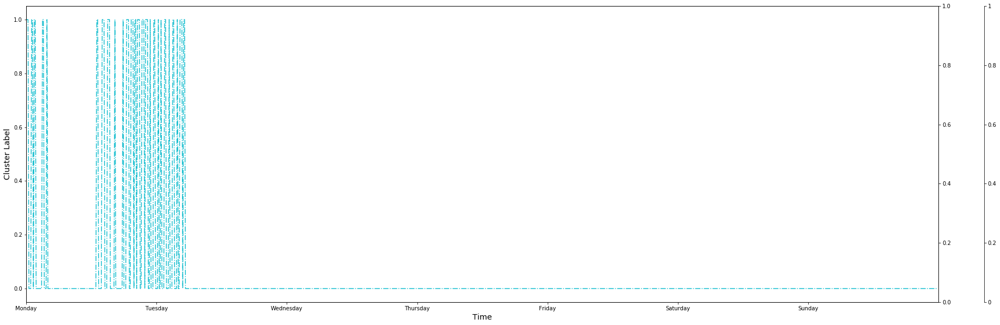

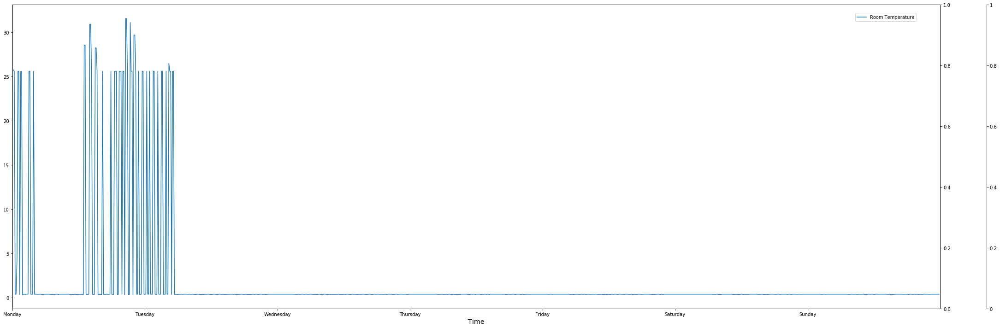

No data forTL3
No data forTL5
No data forTL6


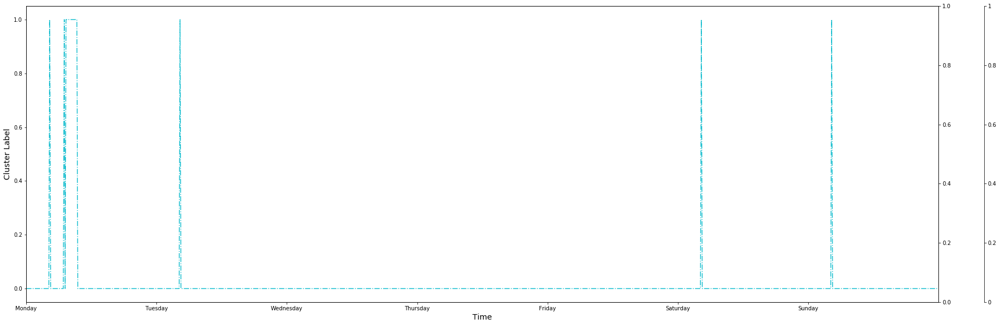

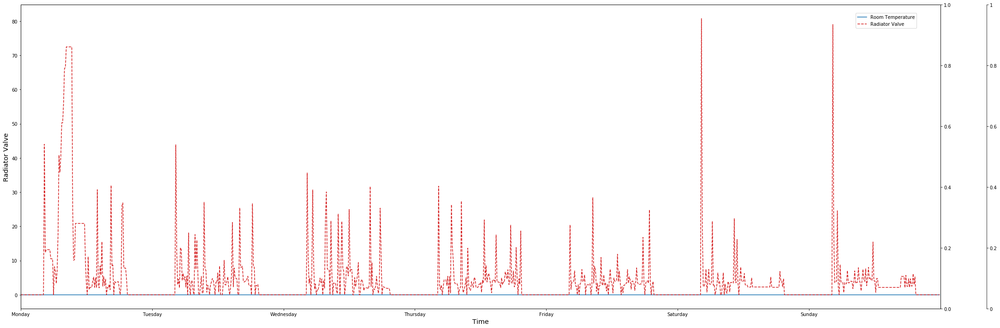

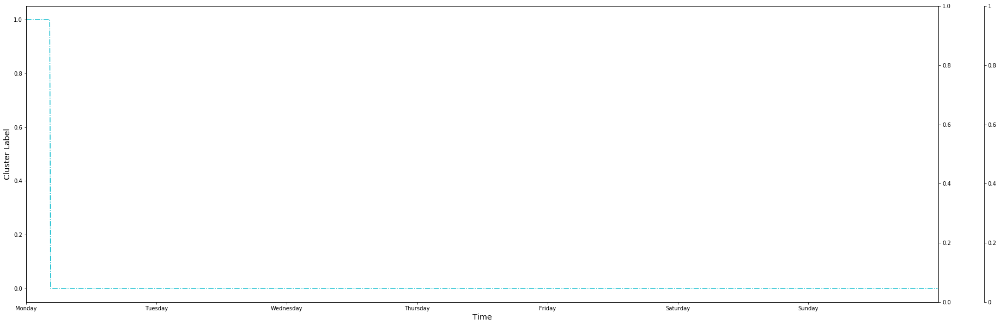

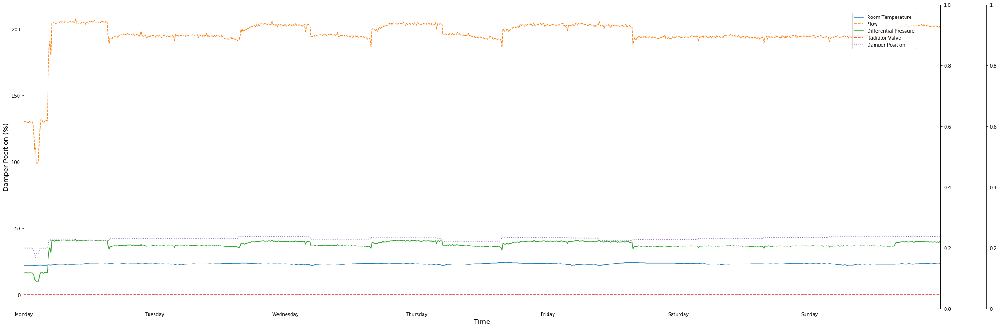

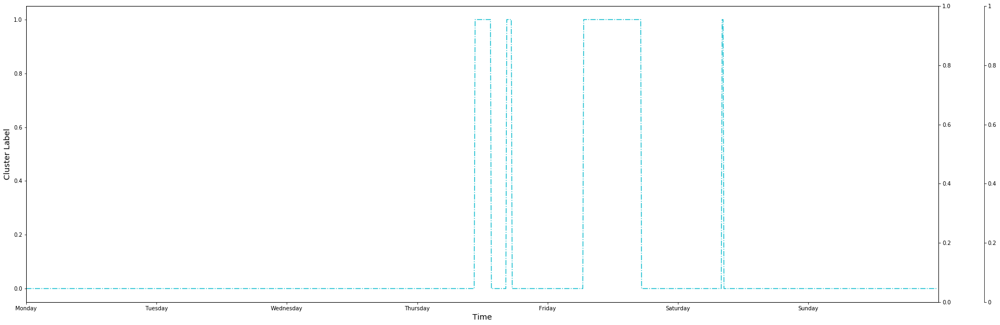

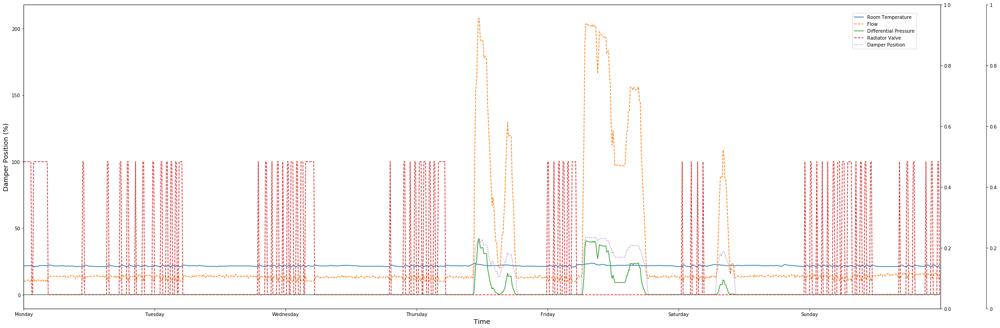

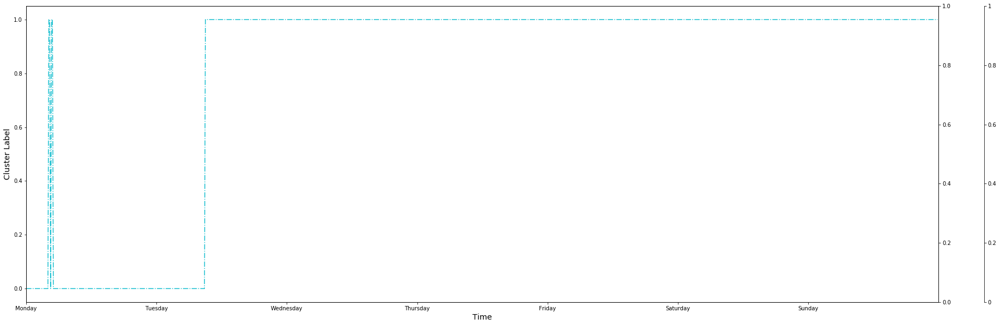

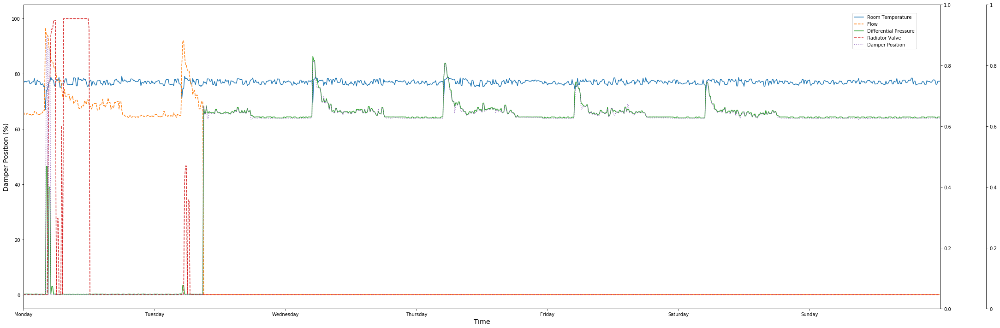

In [21]:
################################################
### Using Clustering to estimate occupancies ###
################################################

#Input: Sensors (['TL1', 'TL3', 'TL5', 'TL8', 'TL6'])
#Output: 1 = one or more peaple | 0 = no occupancies

#Training Data: Weekend Data
#Labeling: Using 1) Clustering

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()

weekend_weight = 1
weekday_weight = 1
number_of_days = days_number
number_of_classes = 2

clustering_data = {}

weight = np.ones(number_of_days * 144)

weight[:244] = weight[:244] * weekend_weight
weight[244:len(weight)] = weight[244:len(weight)] * weekday_weight


for room in room_list:
    if (not(room in black_list)):
        counter = 0
        clustering_data[room] = []
        for sensor in sensor_list:
            try:
                #print(tsdata[room][sensor][1])
                clustering_data[room].append(tsdata[room][sensor][0][1])

            except:
                print("no data for sensor " + str(sensor) + " in room no. " + str(room))

cluster = KMeans(n_clusters = number_of_classes)


#print(tsdata[106])
result = {}
for room in room_list:
    if (not(room in black_list)):
        result[room] = []
        result[room].append(cluster.fit_predict(transpose(clustering_data[room])))

for room in room_list:
    if (not(room in black_list)):
        #print(str(room))
        ClusterPlot(room, result)


no data for sensor TL3 in room no. 200
no data for sensor TL6 in room no. 200
no data for sensor TL3 in room no. 202
no data for sensor TL5 in room no. 202
no data for sensor TL8 in room no. 202
no data for sensor TL6 in room no. 202
no data for sensor TL3 in room no. 300
no data for sensor TL5 in room no. 300
no data for sensor TL6 in room no. 300
No data forTL3
No data forTL6


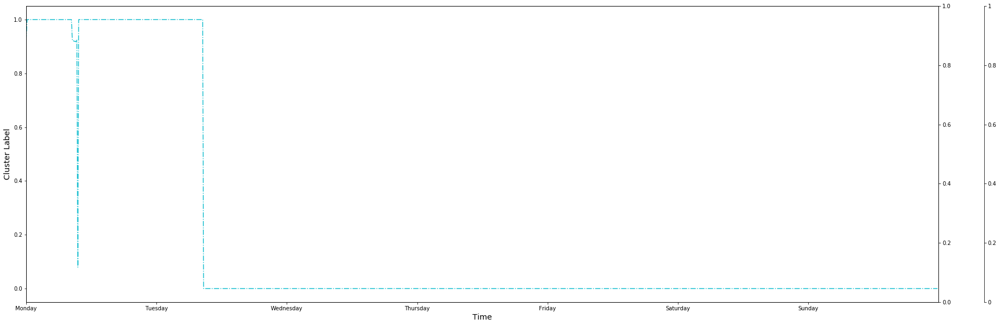

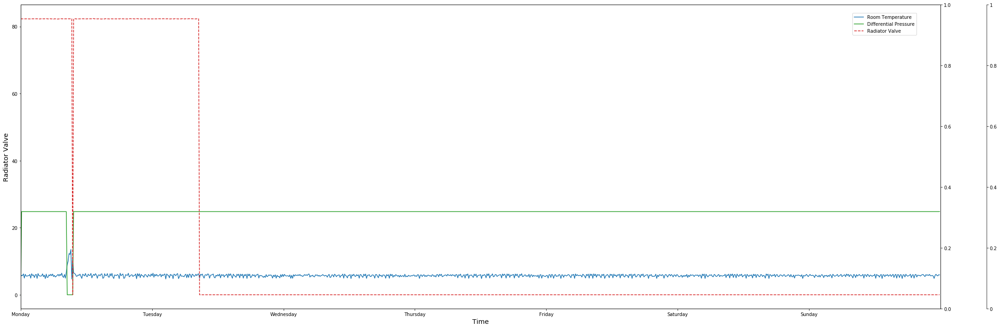

No data forTL3
No data forTL5
No data forTL8
No data forTL6


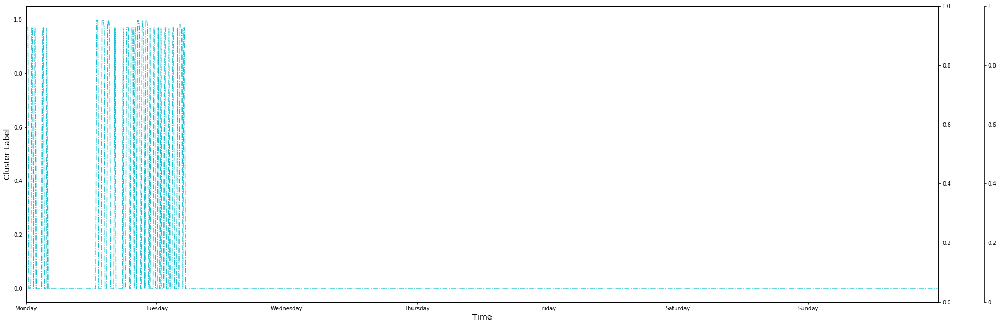

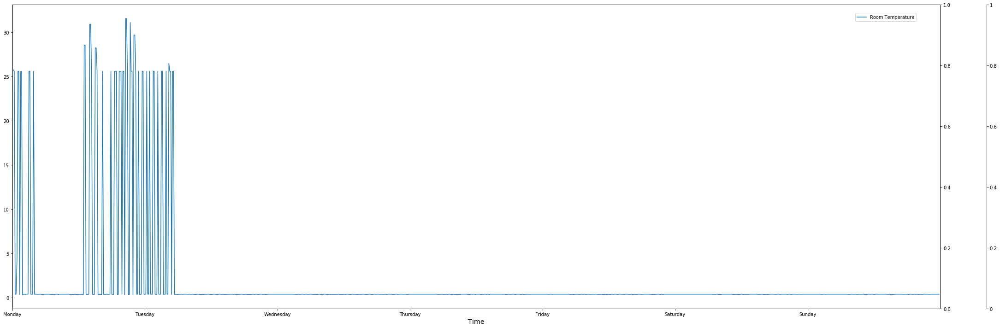

No data forTL3
No data forTL5
No data forTL6


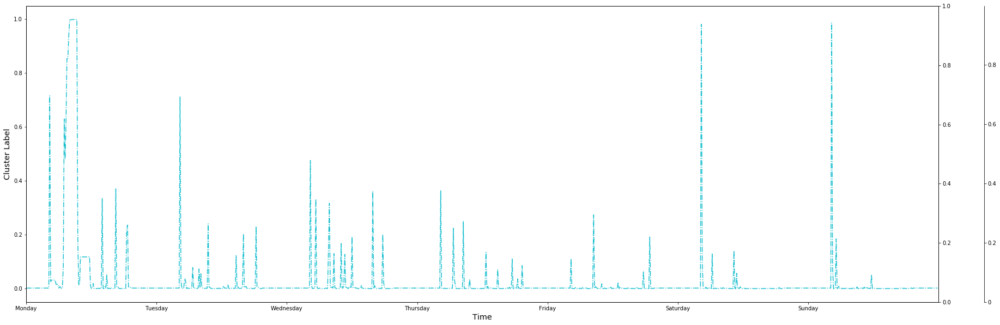

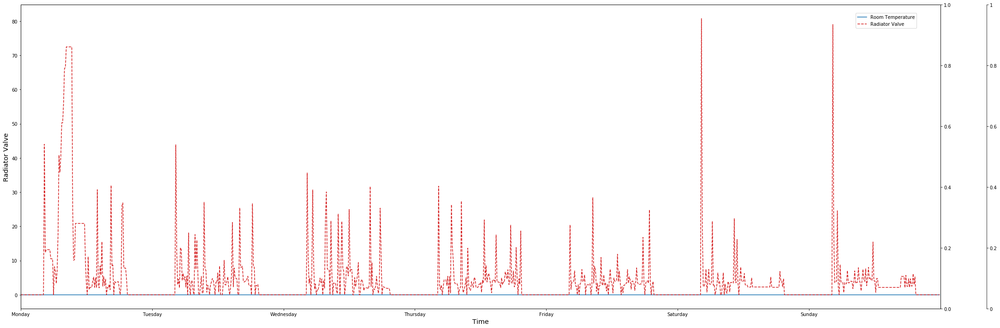

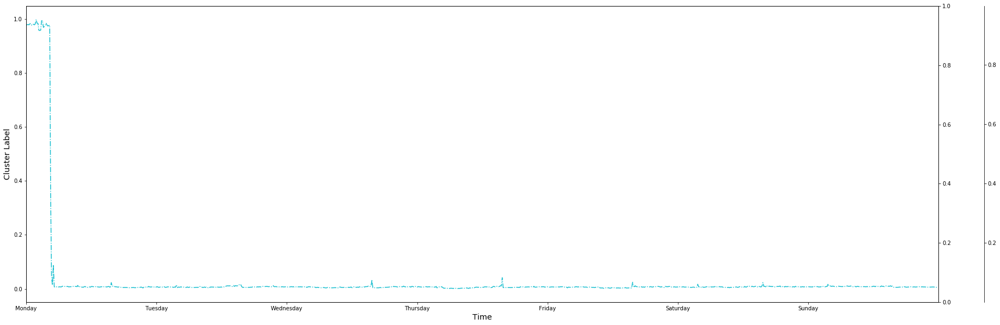

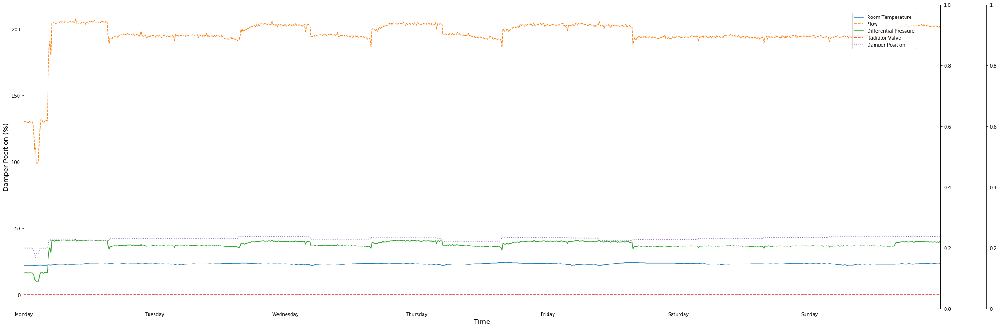

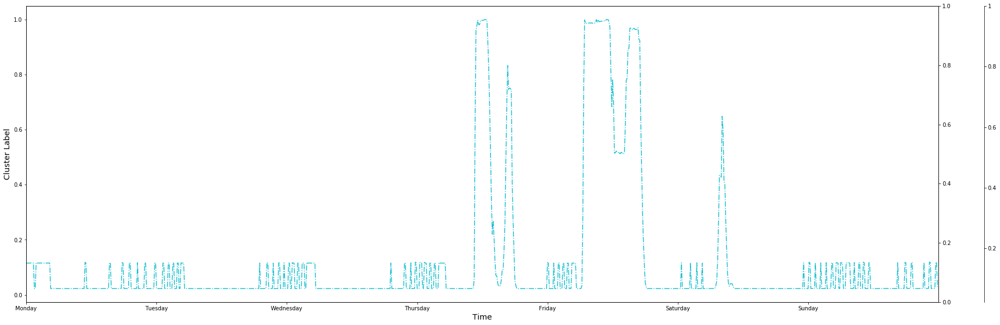

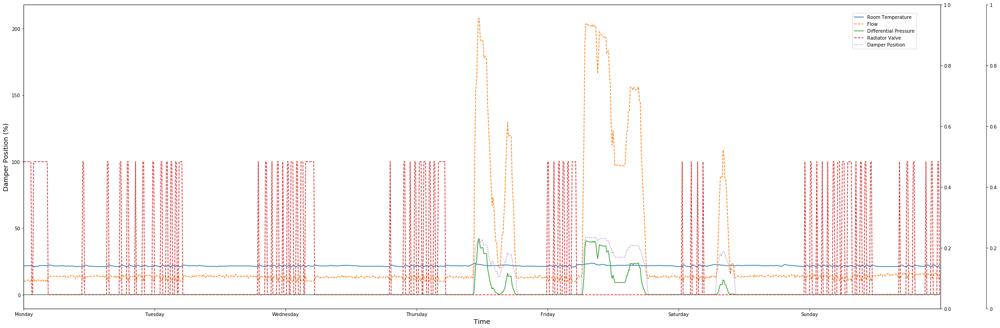

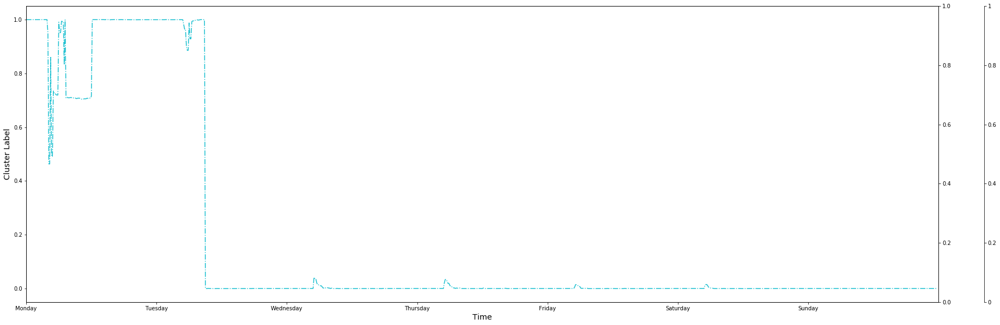

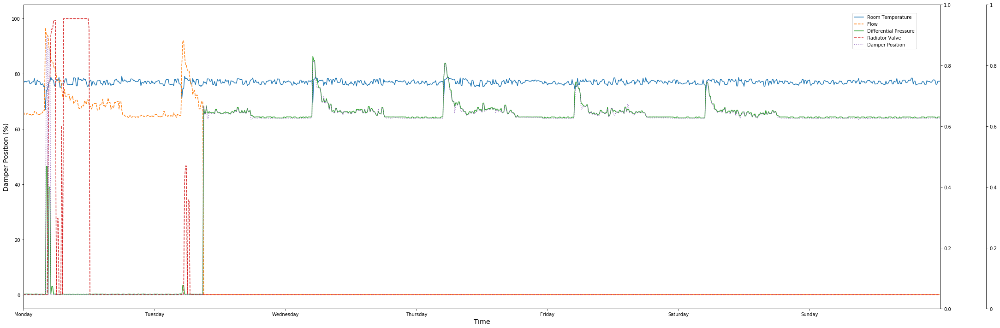

In [22]:
#######################################################
### Using  Fuzzy Clustering to estimate occupancies ###
#######################################################

#Input: Sensors (['TL1', 'TL3', 'TL5', 'TL8', 'TL6'])
#Output: 1 = one or more peaple | 0 = no occupancies

#Training Data: Weekend Data
#Labeling: Using 1) Clustering

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

import skfuzzy as fuzz

import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()

weekend_weight = 1
weekday_weight = 1
number_of_days = 7
number_of_classes = 2
exponentiation = 2
error = 0.005
maxiter = 1000
init = None

clustering_data = {}

weight = np.ones(number_of_days * 144)

weight[:244] = weight[:244] * weekend_weight
weight[244:len(weight)] = weight[244:len(weight)] * weekday_weight


for room in room_list:
    if (not(room in black_list)):
        counter = 0
        clustering_data[room] = []
        for sensor in sensor_list:
            try:
                clustering_data[room].append(tsdata[room][sensor][0][1])

            except:
                print("no data for sensor " + str(sensor) + " in room no. " + str(room))

fuzzy_result = {}
for room in room_list:
    if (not(room in black_list)):
        fuzzy_result[room] = []
        cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(np.array(clustering_data[room]), number_of_classes, exponentiation, error, maxiter, init)
        sum1 = sum(u[1])
        sum2 = sum(u[0])

        if (sum1 <= sum2):
            index = 1
        else:
            index = 0

        fuzzy_result[room].append(u[index])

for room in room_list:
    if (not(room in black_list)):
        # print('room no. is: ' + str(room) + ' Interior zone? ' + str((room in interior_offices_private or room in corridors)))
        ClusterPlot(room, fuzzy_result)

## Confidence Level of Fuzzy-Clustering Method
The following section reports the average and standard deviation of fuzzy-clustering's confidence based on room types. As we can see, the method was less confident on perimeter rooms. This can be attributed to the fact that other environmental factors like outside weather conditions have more significant effect on these zones

In [23]:
###########################################
### Confidence Level based on room type ###
###########################################
import math

def ConfidenceLevel(values):
    dist = 0;
    temp = [x-0.5 for x in values]
    raw = [abs(number) for number in temp]
    norm = [(float(i) - min(raw))/(max(raw) - min(raw) + 1e-30) for i in raw]
    if not(math.isnan(norm[0])):
        return (sum(norm)/len(norm))
    else:
        # print(raw)
        return 0

In [24]:
import numpy as np

confis = []
for room in room_list:
    if (not(room in black_list)):
        confis.append(ConfidenceLevel(fuzzy_result[room][0]))
print('All rooms average Confidence is: ' + str(sum(confis)/len(confis)))
print('All rooms Confidence STD is: ' + str(np.std(confis)) + '\n-----------\n')

# confis = []
# for room in corridors:
#     if (not(room in black_list)):
#         confis.append(ConfidenceLevel(fuzzy_result[room][0]))
# print('Corridors average Confidence is: ' + str(sum(confis)/len(confis)))
# print('Corridors Confidence STD is: ' + str(np.std(confis)) + '\n-----------\n')

# confis = []
# for room in interior_offices_private:
#     if (not(room in black_list)):
#         confis.append(ConfidenceLevel(fuzzy_result[room][0]))
# print('Interior offices average Confidence is: ' + str(sum(confis)/len(confis)))
# print('Interior offices Confidence STD is: ' + str(np.std(confis)) + '\n-----------\n')

# confis = []
# for room in exterior_offices_private:
#     if (not(room in black_list)):
#         confis.append(ConfidenceLevel(fuzzy_result[room][0]))
# print('Exterior offices average Confidence is: ' + str(sum(confis)/len(confis)))
# print('Exterior offices Confidence STD is: ' + str(np.std(confis)) + '\n-----------\n')

# confis = []
# for room in facility_rooms:
#     if (not(room in black_list)):
#         confis.append(ConfidenceLevel(fuzzy_result[room][0]))
# print('Facility rooms average Confidence is: ' + str(sum(confis)/len(confis)))
# print('Facility rooms Confidence STD is: ' + str(np.std(confis)) + '\n-----------\n')

# confis = []
# for room in shared_places:
#     if (not(room in black_list)):
#         confis.append(ConfidenceLevel(fuzzy_result[room][0]))
# print('Shared places average Confidence is: ' + str(sum(confis)/len(confis)))
# print('Shared places Confidence STD is: ' + str(np.std(confis)) + '\n-----------\n')

All rooms average Confidence is: 0.9538832704149763
All rooms Confidence STD is: 0.04391257048193946
-----------



## Using a Classification Algorithm Based on Fuzzy Clustering Results
The membership function in fuzzy clustering method can be seen as the number of occupants in a zone. To do so, we multiply by ten, the membership function value for the cluster that represents existence of occupants. The resulting values can be used as labels. Therefore, we train a sequential classifier on the sensor data for four weeks of data, and test it on the next two weeks of data.

The following are the assumptions of this model:

- The fuzzy clustering result can be seen as the number of occupants
- The maximum number of occupancy for each zone is 10

In [25]:
##########################################################################
### Using a classification algorithm based on fuzzy clustering results ###
##########################################################################

from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.layers import Embedding
from keras.layers import LSTM
import keras.utils
import numpy as np
import pprint
import math
import keras
from keras.optimizers import SGD


training_chunk = 4032
validation_chunk = 576

result2 = {}
for room in room_list:
    if (not(room in black_list)):
        result2[room] = []
        for i in range(len(fuzzy_result[room][0])):
            result2[room].append(int(fuzzy_result[room][0][i] * 10))

history = {}
evaluations = {}

for room in room_list:
    if (not(room in black_list)):
        print(room)
        data_count = len(result2[room])
        features_count = len(clustering_data[room])
        classes_count = math.ceil(max(result2[room])*10)

        history[room] = []
        labels_train = keras.utils.to_categorical(result2[room][:training_chunk], num_classes=classes_count)
        labels_test = keras.utils.to_categorical(result2[room][training_chunk:], num_classes=classes_count)

        X_train = transpose(np.asarray(clustering_data[room]))[:training_chunk]
        X_test = transpose(np.asarray(clustering_data[room]))[training_chunk:]
        evaluations[room] = []

        model = Sequential()
        model.add(Dense(features_count, activation='relu', input_dim=features_count))
        model.add(Dense(classes_count, activation='softmax'))
        sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
        model.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])
        history[room] = model.fit(X_train, labels_train, epochs=20, batch_size=128)
        evaluations[room] = model.evaluate(X_test, labels_test, batch_size=128)
        

C:\ProgramData\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.

Using TensorFlow backend.


200
Epoch 1/20
4032/4032 [==============================] - 0s 75us/step - loss: 2.0947 - acc: 0.9546
Epoch 2/20
4032/4032 [==============================] - 0s 35us/step - loss: 1.3209 - acc: 0.9985
Epoch 3/20
4032/4032 [==============================] - 0s 36us/step - loss: 0.7131 - acc: 0.9993
Epoch 4/20
4032/4032 [==============================] - 0s 33us/step - loss: 0.3557 - acc: 1.0000
Epoch 5/20
4032/4032 [==============================] - 0s 37us/step - loss: 0.1987 - acc: 1.0000
Epoch 6/20
4032/4032 [==============================] - 0s 35us/step - loss: 0.1299 - acc: 1.0000
Epoch 7/20
4032/4032 [==============================] - 0s 35us/step - loss: 0.0948 - acc: 1.0000
Epoch 8/20
4032/4032 [==============================] - 0s 34us/step - loss: 0.0741 - acc: 1.0000
Epoch 9/20
4032/4032 [==============================] - 0s 35us/step - loss: 0.0606 - acc: 1.0000
Epoch 10/20
4032/4032 [==============================] - 0s 35us/step - loss: 0.0512 - acc: 1.0000
Epoch 11/20
403

4032/4032 [==============================] - 0s 77us/step - loss: 5.2999 - acc: 0.5687
Epoch 2/20
4032/4032 [==============================] - 0s 34us/step - loss: 4.8812 - acc: 0.6902
Epoch 3/20
4032/4032 [==============================] - 0s 34us/step - loss: 4.7980 - acc: 0.6932
Epoch 4/20
4032/4032 [==============================] - 0s 37us/step - loss: 4.7283 - acc: 0.6932
Epoch 5/20
4032/4032 [==============================] - 0s 35us/step - loss: 4.6637 - acc: 0.6932
Epoch 6/20
4032/4032 [==============================] - 0s 35us/step - loss: 4.6051 - acc: 0.6932
Epoch 7/20
4032/4032 [==============================] - 0s 35us/step - loss: 4.5535 - acc: 0.6932
Epoch 8/20
4032/4032 [==============================] - 0s 34us/step - loss: 4.5098 - acc: 0.6932
Epoch 9/20
4032/4032 [==============================] - 0s 34us/step - loss: 4.4747 - acc: 0.6930
Epoch 10/20
4032/4032 [==============================] - 0s 35us/step - loss: 4.4468 - acc: 0.6932
Epoch 11/20
4032/4032 [=======

In [26]:
for room in room_list:
    if (not(room in black_list)):
        print(room)
        print('\t[loss, accuracy] on test data: ' + str(evaluations[room]))

200
	[loss, accuracy] on test data: [0.0190445463808756, 1.0]
202
	[loss, accuracy] on test data: [3.0951620962855126, 0.8075396825396826]
300
	[loss, accuracy] on test data: [0.6645451689523364, 0.9588293650793651]
551
	[loss, accuracy] on test data: [4.101480521853008, 0.7455357142857143]
552
	[loss, accuracy] on test data: [4.006125298757402, 0.7291666666666666]
700
	[loss, accuracy] on test data: [0.0660830329334925, 0.9955357142857143]


In [28]:
import numpy as np

accuracies = {}
for room in room_list:
    if (not(room in black_list)):
        accuracies[room] = []
        accuracies[room].append(evaluations[room][1])

acc = []
for room in room_list:
    if (not(room in black_list)):
        acc.append(accuracies[room])
print('All rooms mean is: ' + str(sum(acc)/len(acc)))
print('All rooms STD is: ' + str(np.std(acc)) + '\n-----------\n')

        
# acc = []
# for room in corridors:
#     if (not(room in black_list)):
#         acc.append(accuracies[room])
# print('Corridors mean is: ' + str(sum(acc)/len(acc)))
# print('Corridors STD is: ' + str(np.std(acc)) + '\n-----------\n')

# acc = []
# for room in interior_offices_private:
#     if (not(room in black_list)):
#         acc.append(accuracies[room])
# print('Interior offices mean is: ' + str(sum(acc)/len(acc)))
# print('Interior offices STD is: ' + str(np.std(acc)) + '\n-----------\n')

# acc = []
# for room in exterior_offices_private:
#     if (not(room in black_list)):
#         acc.append(accuracies[room])
# print('Exterior offices mean is: ' + str(sum(acc)/len(acc)))
# print('Exterior offices STD is: ' + str(np.std(acc)) + '\n-----------\n')

# acc = []
# for room in facility_rooms:
#     if (not(room in black_list)):
#         acc.append(accuracies[room])
# print('Facility rooms mean is: ' + str(sum(acc)/len(acc)))
# print('Facility rooms STD is: ' + str(np.std(acc)) + '\n-----------\n')

# acc = []
# for room in shared_places:
#     if (not(room in black_list)):
#         acc.append(accuracies[room])
# print('Shared places mean is: ' + str(sum(acc)/len(acc)))
# print('Shared places STD is: ' + str(np.std(acc)) + '\n-----------\n')

All rooms mean is: 0.8727678571428572
All rooms STD is: 0.11527545482888425
-----------



## Designing a classifier to predict the $q[n]$ from Aswani's Method
The classifier has the same structure as the previous one. But now, we are interested to predict the value of $q[n]$. So, the input the sensor values, and output of the classifier is $q[n]$.

In [29]:
########################################################
### Designing a classifier to predict the Aswani's Q ###
########################################################

from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.layers import Embedding
from keras.layers import LSTM
import keras.utils
import numpy as np
import pprint
import math
import keras
from keras.optimizers import SGD


########################################################

training_chunk = 4032
validation_chunk = 576

result2 = {}
for room in room_list:
    if (not(room in black_list)):
        result2[room] = q_p[room][0]

history = {}
evaluations = {}

for room in room_list:
    if (not(room in black_list)):
        print(room)
        data_count = len(result2[room])
        features_count = len(clustering_data[room])
        classes_count = math.ceil(max(result2[room])*10)

        history[room] = []
        labels_train = keras.utils.to_categorical(result2[room][:training_chunk], num_classes=classes_count)
        labels_test = keras.utils.to_categorical(result2[room][training_chunk:], num_classes=classes_count)

        X_train = transpose(np.asarray(clustering_data[room]))[:training_chunk]
        X_test = transpose(np.asarray(clustering_data[room]))[training_chunk:-1]
        evaluations[room] = []

        model = Sequential()
        model.add(Dense(features_count, activation='relu', input_dim=features_count))
        model.add(Dense(classes_count, activation='softmax'))
        sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
        model.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])
        history[room] = model.fit(X_train, labels_train, epochs=20, batch_size=128)
        evaluations[room] = model.evaluate(X_test, labels_test, batch_size=128)
        

200
Epoch 1/20
4032/4032 [==============================] - 0s 119us/step - loss: 1.8759 - acc: 0.8646
Epoch 2/20
4032/4032 [==============================] - 0s 65us/step - loss: 1.7229 - acc: 0.8931
Epoch 3/20
4032/4032 [==============================] - 0s 69us/step - loss: 1.7229 - acc: 0.8931
Epoch 4/20
4032/4032 [==============================] - 0s 64us/step - loss: 1.7229 - acc: 0.8931
Epoch 5/20
4032/4032 [==============================] - 0s 64us/step - loss: 1.7229 - acc: 0.8931
Epoch 6/20
4032/4032 [==============================] - 0s 65us/step - loss: 1.7229 - acc: 0.8931
Epoch 7/20
4032/4032 [==============================] - 0s 65us/step - loss: 1.7229 - acc: 0.8931
Epoch 8/20
4032/4032 [==============================] - 0s 66us/step - loss: 1.7229 - acc: 0.8931
Epoch 9/20
4032/4032 [==============================] - 0s 64us/step - loss: 1.7229 - acc: 0.8931
Epoch 10/20
4032/4032 [==============================] - ETA: 0s - loss: 1.7277 - acc: 0.892 - 0s 68us/step - los

4032/4032 [==============================] - 1s 154us/step - loss: 0.8438 - acc: 0.9018
Epoch 2/20
4032/4032 [==============================] - 0s 33us/step - loss: 0.0320 - acc: 0.9980
Epoch 3/20
4032/4032 [==============================] - 0s 19us/step - loss: 0.0320 - acc: 0.9980
Epoch 4/20
4032/4032 [==============================] - 0s 18us/step - loss: 0.0320 - acc: 0.9980
Epoch 5/20
4032/4032 [==============================] - 0s 18us/step - loss: 0.0320 - acc: 0.9980
Epoch 6/20
4032/4032 [==============================] - 0s 25us/step - loss: 0.0320 - acc: 0.9980
Epoch 7/20
4032/4032 [==============================] - 0s 32us/step - loss: 0.0320 - acc: 0.9980
Epoch 8/20
4032/4032 [==============================] - 0s 24us/step - loss: 0.0320 - acc: 0.9980
Epoch 9/20
4032/4032 [==============================] - 0s 19us/step - loss: 0.0320 - acc: 0.9980
Epoch 10/20
4032/4032 [==============================] - 0s 18us/step - loss: 0.0320 - acc: 0.9980
Epoch 11/20
4032/4032 [======

In [31]:
import numpy as np

accuracies = {}
for room in room_list:
    if (not(room in black_list)):
        accuracies[room] = []
        accuracies[room].append(evaluations[room][1])

acc = []
for room in room_list:
    if (not(room in black_list)):
        acc.append(accuracies[room])
print('All rooms mean is: ' + str(sum(acc)/len(acc)))
print('All rooms STD is: ' + str(np.std(acc)) + '\n-----------\n')
        
# acc = []
# for room in corridors:
#     if (not(room in black_list)):
#         acc.append(accuracies[room])
# print('Corridors mean is: ' + str(sum(acc)/len(acc)))
# print('Corridors STD is: ' + str(np.std(acc)) + '\n-----------\n')

# acc = []
# for room in interior_offices_private:
#     if (not(room in black_list)):
#         acc.append(accuracies[room])
# print('Interior offices mean is: ' + str(sum(acc)/len(acc)))
# print('Interior offices STD is: ' + str(np.std(acc)) + '\n-----------\n')

# acc = []
# for room in exterior_offices_private:
#     if (not(room in black_list)):
#         acc.append(accuracies[room])
# print('Exterior offices mean is: ' + str(sum(acc)/len(acc)))
# print('Exterior offices STD is: ' + str(np.std(acc)) + '\n-----------\n')

# acc = []
# for room in facility_rooms:
#     if (not(room in black_list)):
#         acc.append(accuracies[room])
# print('Facility rooms mean is: ' + str(sum(acc)/len(acc)))
# print('Facility rooms STD is: ' + str(np.std(acc)) + '\n-----------\n')

# acc = []
# for room in shared_places:
#     if (not(room in black_list)):
#         acc.append(accuracies[room])
# print('Shared places mean is: ' + str(sum(acc)/len(acc)))
# print('Shared places STD is: ' + str(np.std(acc)) + '\n-----------\n')

All rooms mean is: 0.8220016543681806
All rooms STD is: 0.242329795494165
-----------



In [32]:
for room in room_list:
    if (not(room in black_list)):
        print(room)
        print('\t[loss, accuracy] on test data: ' + str(evaluations[room]))

200
	[loss, accuracy] on test data: [0.4399481030832745, 0.9727047154092907]
202
	[loss, accuracy] on test data: [1.6342305068638425, 0.45558312655086847]
300
	[loss, accuracy] on test data: [0.016248388303716485, 1.0]
551
	[loss, accuracy] on test data: [0.015360190363476058, 0.9995037220843672]
552
	[loss, accuracy] on test data: [0.008245123911732185, 0.9995037220843672]
700
	[loss, accuracy] on test data: [4.382121459189479, 0.5047146400801893]


## Average of Fuzzy Clustering Method to Infer occupancies in a week
Given six weeks of data and the fuzzy clustering result on the data, we are able to calculate the average of each time slot in a week. The result, for each zone, can be interpreted as how likely it is to have occupancy in a given time of a week. 

In [33]:
##################################################################
### Average of fuzzy clustering to infer occupancies in a week ###
##################################################################
import numpy as np
number_of_weeks = 6

occ = {}
for room in room_list:
    if (not(room in black_list)):
        occ[room] = [np.zeros(1008)]
        for i in range(len(fuzzy_result[room][0])):
            occ[room][0][i%1008] += fuzzy_result[room][0][i]

        occ[room][0][:] = [x / number_of_weeks for x in occ[room][0]]

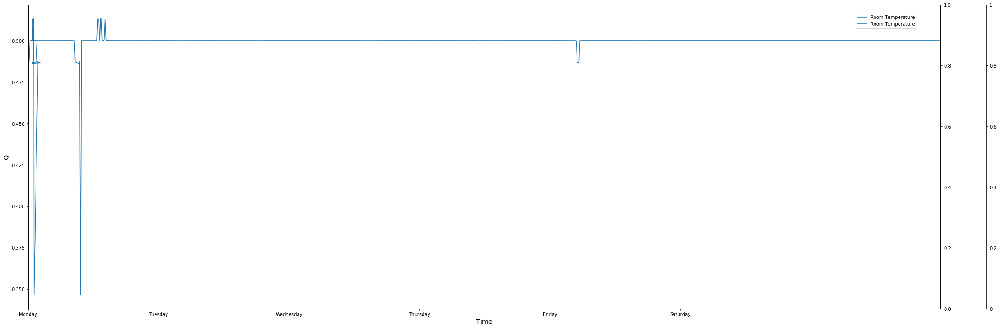

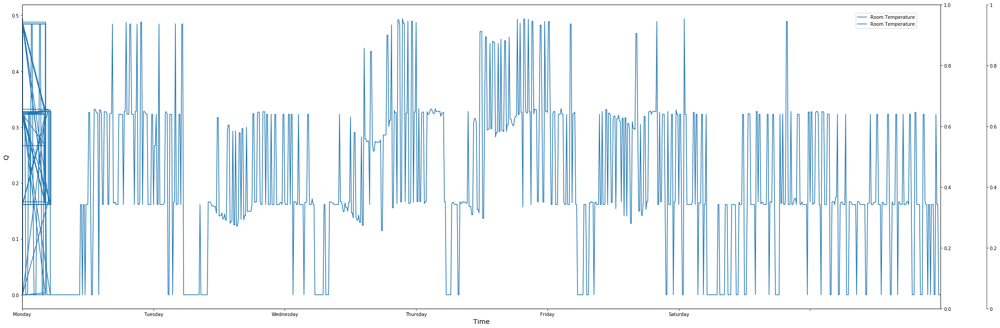

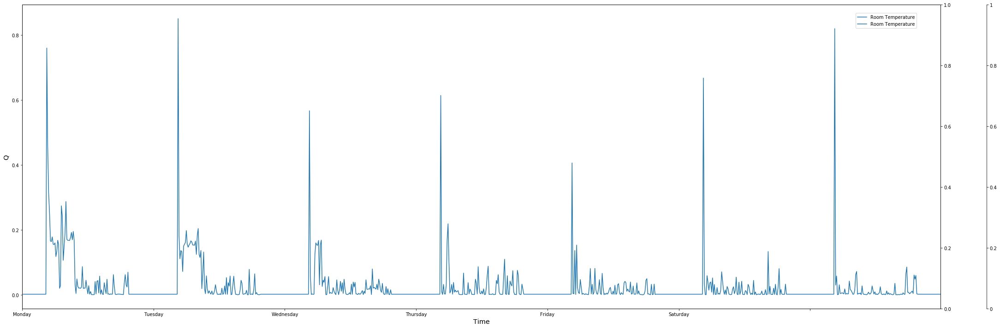

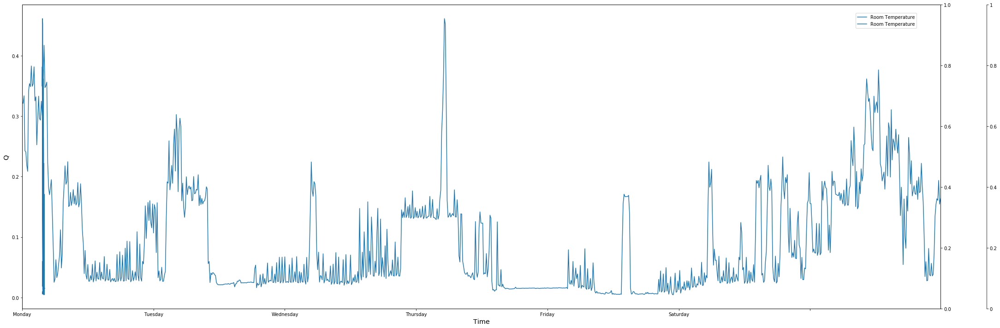

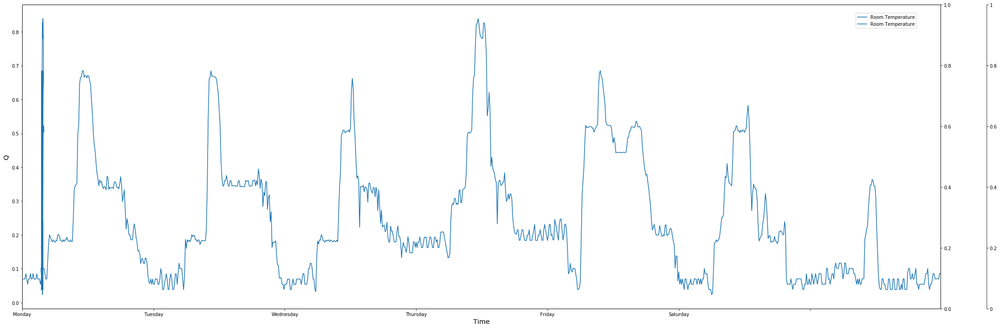

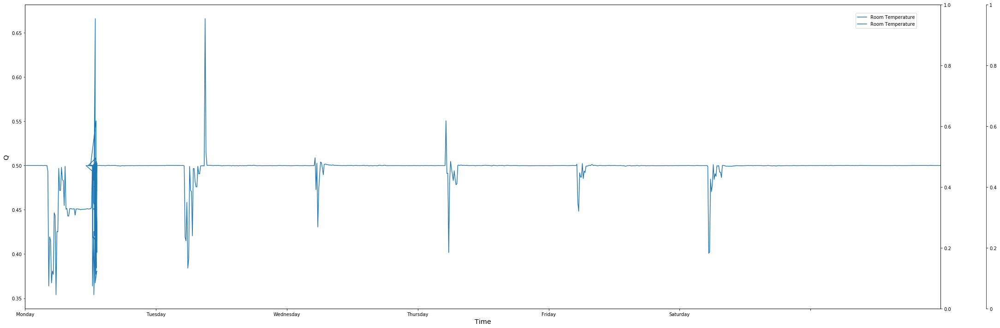

In [34]:
for room in room_list:
    if (not(room in black_list)):
        plotAllSensorData(room, occ, 0)